In [1]:
%pip install -q --no-warn-conflicts malariagen_data
%pip install -q --no-warn-conflicts petl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 33.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 205.1/205.1 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.7/71.7 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 88.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 117.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 775.9/775.9 kB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 62.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 50.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 78.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.3/211.3 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB

In [2]:
#!apt-get -qq update
#!apt-get -qq install -y build-essential python3-dev
#!pip install -q cython

In [3]:
import allel
import malariagen_data
import numpy as np
import pyximport
import pandas as pd
import dask
import dask.array as da
# silence some dask warnings
dask.config.set(**{'array.slicing.split_large_chunks': True})
from dask.diagnostics.progress import ProgressBar
import scipy
from scipy.spatial.distance import pdist, squareform

In [4]:
# plotting setup
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

In [5]:
import random
import functools
import petl as ptl
import itertools
import scipy
from collections import Counter

In [63]:
from PIL import Image
from io import BytesIO

In [7]:
#Mounting Google Drive
import os
from google.colab import drive
drive.mount("drive")

# make dir
results_dir = 'drive/MyDrive/sanger_analyses/resistance/'
os.makedirs(results_dir, exist_ok=True)
os.chdir(results_dir)
#os.listdir()

Mounted at drive


In [8]:
#import sys
#sys.path.append('/home/mkient/Desktop/IR/src/')

#%run src/setup.ipynb
#import hapclust
%run 'VGSC/src/hapclust.py'

In [9]:
## Importing malariagen data set
ag3 = malariagen_data.Ag3("gs://vo_agam_release_master_us_central1/", pre=True)
ag3

<MalariaGEN Ag3 API client>
Storage URL             : gs://vo_agam_release_master_us_central1/
Data releases available : 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 3.10, 3.11, 3.12, 3.13, 3.14, 3.15, 3.16
Results cache           : None
Cohorts analysis        : 20250815
AIM analysis            : 20220528
Site filters analysis   : dt_20200416
Software version        : malariagen_data 15.4.0
Client location         : South Carolina, United States (Google Cloud us-east1)
---
Please note that data are subject to terms of use,
for more information see https://www.malariagen.net/data
or contact support@malariagen.net. For API documentation see 
https://malariagen.github.io/malariagen-data-python/v15.4.0/Ag3.html

In [10]:
df_samples=ag3.sample_metadata(sample_sets='3.11',
                               sample_query='country=="Burkina Faso" and taxon != "unassigned" and year > 2021')
sets = list(df_samples.sample_set.unique())
#df_samples.groupby(['location','year','aim_species','sex_call']).size() #only one female from An. arabiensis - SK

## Basic manip

In [11]:
#2358158-5000, 2431617+5000

In [12]:
#To access to the haplotypes within the 2L chromosomes
ds_haps = ag3.haplotypes(region="2L:2353158-2436617", analysis='gamb_colu_arab',
                         sample_sets=sets, sample_query='taxon != "unassigned" and year > 2021')
ds_pos = allel.SortedIndex(ds_haps['variant_position'].data)

In [20]:
# samples phase
samples_phased = ds_haps['sample_id'].values
df_samples_phased = df_samples.set_index("sample_id").loc[samples_phased].reset_index()
dfs_haps = df_samples_phased.loc[df_samples_phased.index.repeat(2)].reset_index(drop=True)
#df_samples_phased['pops'] = [loc[:4]+'_'+sp[:3] for loc, sp in zip(df_samples_phased.location,df_samples_phased.aim_species)]
dfs_haps['pops'] = [loc[:4]+'_'+sp[:3] for loc, sp in zip(dfs_haps.location,dfs_haps.taxon)]
dfs_haps['pops1'] = [tax for tax in dfs_haps.taxon]
dfs_haps['pops2'] = ['A'+sp[:3] for sp in dfs_haps.taxon]


### comput gt and ht
gt = allel.GenotypeDaskArray(ds_haps["call_genotype"].data)
ht = gt.to_haplotypes().compute()

## count alleles
ds_ac = ht.count_alleles(max_allele=1)
loc_seg = ds_ac.is_segregating()
ht_seg = ht[loc_seg]
ds_pos_loc = ds_pos[loc_seg]

## array of haps indices
hap_ixs = np.arange(len(dfs_haps))
#hap_ixs

## load haplotypes data
haplo_sample_id = np.load('VGSC/data/haplo_sample_id_all.npy',
                          allow_pickle=True).item()
## mapping to df_samples
map_dict = {}
for hap in haplo_sample_id.keys():
  hap_i = haplo_sample_id[hap]
  for sample_id in hap_i:
    map_dict[sample_id] = hap
len(map_dict.keys())

hap_labels = {
    'FVI/FVI': '995F+402V+1527I//995F+402V+1527I',
    'FL1T/LVI': '995F+402L(g>t)+1527T//995L+402V+1527I',
    'LL1T/LL1T':'995L+402L(g>t)+1527T//995L+402L(g>t)+1527T',
    'LL1T/LL2T': '995L+402L(g>t)+1527T//995L+402L(g>c)+1527T',
    'FL2T/LVI': '995F+402L(g>c)+1527T//995L+402V+1527I',
    'OD': 'Other diplotypes'
}

dfs_haps['haplo_id1'] = dfs_haps.sample_id.map(map_dict)
dfs_haps['haplo_id'] = dfs_haps.haplo_id1.map(hap_labels)
#dfs_haps

In [21]:
## load vgsc SNP
#df_vgsc1 = pd.read_csv('VGSC/data/snp1_freq.csv')
df_vgsc1 = pd.read_csv('VGSC/data/df_vgsc_maxaf.csv').drop('frq_Bana_col_2021', axis=1)
#df_vgsc_frq.drop('frq_Bana_col_2021', axis=1)
sel_vars = ['V402L', 'L995S', 'L995F', 'P1874S', 'P1874L','I1527T', 'N1570Y','T791M','A1553T',]
df_vgsc = df_vgsc1.query(f"aa_change in {sel_vars}")
#df_vgsc = df_vgsc#.query('effect in ["NON_SYNONYMOUS_CODING", "SYNONYMOUS_CODING"]')
#df_vgsc

## vars pos
vars_pos = allel.SortedIndex(df_vgsc.position)
pos_indf = []
for i in list(vars_pos):
    if i in list(ds_pos):
        pos_indf.append(i)
pos_dt = ds_pos.locate_keys(pos_indf)
dt = allel.SortedIndex(ds_pos[pos_dt])
np.count_nonzero(pos_dt)

8

In [15]:
#df_vgsc1.columns

In [22]:
## variant tables - variant list
etl_df = ptl.fromdataframe(df_vgsc)
#etl_df
pos2label = etl_df.lookupone('position', 'aa_change')
print(pos2label[2429617])

## check variant label
variant_labels = np.array([pos2label.get(p, '') for p in ds_pos], dtype=object)
len(variant_labels) == len(ds_pos)

I1527T


True

In [23]:
variant_labels

array(['', '', '', ..., '', '', ''], dtype=object)

In [24]:
dfs_haps['pops'].unique()

array(['Bana_col', 'Bana_gam', 'Sour_col', 'Sour_gam', 'Sour_ara',
       'Nass_col', 'Nass_ara', 'Nass_gam', 'Side_col', 'Side_gam',
       'Side_ara', 'Degu_gam', 'Degu_col', 'Po-D_ara', 'Po-D_gam',
       'Po-D_col', 'Gama_ara', 'Gama_col', 'Gama_gam', 'Ouro_col',
       'Ouro_ara', 'Naga_gam', 'Naga_col', 'Naga_ara'], dtype=object)

In [25]:
## Pop colors
pops = dfs_haps.pops.values
pops1 = dfs_haps.pops1.values
pops2 = dfs_haps.pops2.values
diplo_id = dfs_haps.haplo_id.values
cols = sns.color_palette("husl", n_colors=len(pops))

#pop_colors = {
#    'Bana_gam':'red', 'Bana_col':'lightsteelblue', 'Bana_int':'gold', 'Sour_col':'deepskyblue',
#    'Sour_gam':'rosybrown', 'Sour_ara':'darkgreen', 'Nass_col':'mediumpurple', 'Nass_ara':'turquoise',
#    'Nass_gam':'maroon', 'Side_col':'cornflowerblue', 'Side_gam':'lightcoral', 'Side_ara':'mediumaquamarine',
#    'Degu_gam':'firebrick', 'Degu_col':'lightskyblue', 'Degu_int':'gold', 'Po-D_ara':'yellowgreen',
#    'Po-D_gam':'hotpink', 'Po-D_col':'magenta', 'Gama_ara':'olive', 'Gama_col':'purple',
#    'Gama_gam':'peru', 'Ouro_col':'blue', 'Ouro_ara':'cyan', 'Ouro_int':'gold',
#    'Naga_gam':'orange', 'Naga_col':'darkblue', 'Naga_ara':'teal'
#}

#pop_colors1 = {
#    'Bana_gam':'red', 'Bana_col':'green', 'Bana_int':'olive', 'Sour_col':'green',
#    'Sour_gam':'red', 'Sour_ara':'magenta', 'Nass_col':'green', 'Nass_ara':'magenta',
#    'Nass_gam':'red', 'Side_col':'green', 'Side_gam':'red', 'Side_ara':'magenta',
#    'Degu_gam':'red', 'Degu_col':'green', 'Degu_int':'olive', 'Po-D_ara':'magenta',
#    'Po-D_gam':'red', 'Po-D_col':'green', 'Gama_ara':'magenta', 'Gama_col':'green',
#    'Gama_gam':'red', 'Ouro_col':'green', 'Ouro_ara':'magenta', 'Ouro_int':'olive',
#    'Naga_gam':'red', 'Naga_col':'green', 'Naga_ara':'magenta'
#}

pop_colors = {
    'Bana_gam':'red', 'Bana_col':'lightsteelblue', 'Sour_col':'deepskyblue', 'Sour_gam':'rosybrown',
    'Sour_ara':'darkgreen','Nass_col':'mediumpurple', 'Nass_ara':'turquoise', 'Nass_gam':'maroon',
    'Side_col':'cornflowerblue', 'Side_gam':'lightcoral','Side_ara':'mediumaquamarine',
    'Degu_gam':'firebrick', 'Degu_col':'lightskyblue', 'Po-D_ara':'yellowgreen','Po-D_gam':'hotpink',
    'Po-D_col':'magenta', 'Gama_ara':'olive', 'Gama_col':'purple', 'Gama_gam':'peru','Ouro_col':'blue',
    'Ouro_ara':'cyan', 'Naga_gam':'orange', 'Naga_col':'darkblue', 'Naga_ara':'teal'
}

pop_colors1 = {
    'gambiae':'blue', 'coluzzii':'red',
    'arabiensis':'green', 'unassigned':'darkviolet'
}

pop_colors2 = {
    'Agam':'blue', 'Acol':'red',
    'Aara':'green'
}

var_colors = dict({
    -1 : "orange",
    0  : "lightgray",
    1  : "deepskyblue",
    2  : "blue",
    3  : "violet",
})

hap_labels = {
    'FVI/FVI': '995F+402V+1527I//995F+402V+1527I',
    'FL1T/LVI': '995F+402L(g>t)+1527T//995L+402V+1527I',
    'LL1T/LL1T':'995L+402L(g>t)+1527T//995L+402L(g>t)+1527T',
    'LL1T/LL2T': '995L+402L(g>t)+1527T//995L+402L(g>c)+1527T',
    'FL2T/LVI': '995F+402L(g>c)+1527T//995L+402V+1527I',
    'OD': 'Other diplotypes'
}



color_haps = {'FVI/FVI':'#069AF3',
              'FL1T/LVI':'#F97306',
              'LL1T/LL1T':'#9A0EEA',
              'LL1T/LL2T':'#A9561E',
              'FL2T/LVI':'#FFD700' ,
              'OD':'#06C2AC'}

colors_diplo = {'995F+402V+1527I//995F+402V+1527I':'#069AF3',
                '995F+402L(g>t)+1527T//995L+402V+1527I':'#F97306',
                '995L+402L(g>t)+1527T//995L+402L(g>t)+1527T':'#9A0EEA',
                '995L+402L(g>t)+1527T//995L+402L(g>c)+1527T':'#A9561E',
                '995F+402L(g>c)+1527T//995L+402V+1527I':'#FFD700' ,
                'Other diplotypes':'#06C2AC'}

## pop
hap_colors = np.array([pop_colors[p] for p in pops])
hap_colors1 = np.array([pop_colors1[p] for p in pops1])
hap_colors2 = np.array([pop_colors2[p] for p in pops2])
diplo_colors = np.array([colors_diplo[p] for p in diplo_id])

### Haplotype networks - global

In [26]:
ag3.plot_haplotype_network(region="2L:2358158-2431617",
                           analysis='gamb_colu_arab',
                           sample_sets=sets,
                           sample_query='taxon!="unassigned" and year>2021',
                           color='taxon')

Load haplotypes:   0%|          | 0/63 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

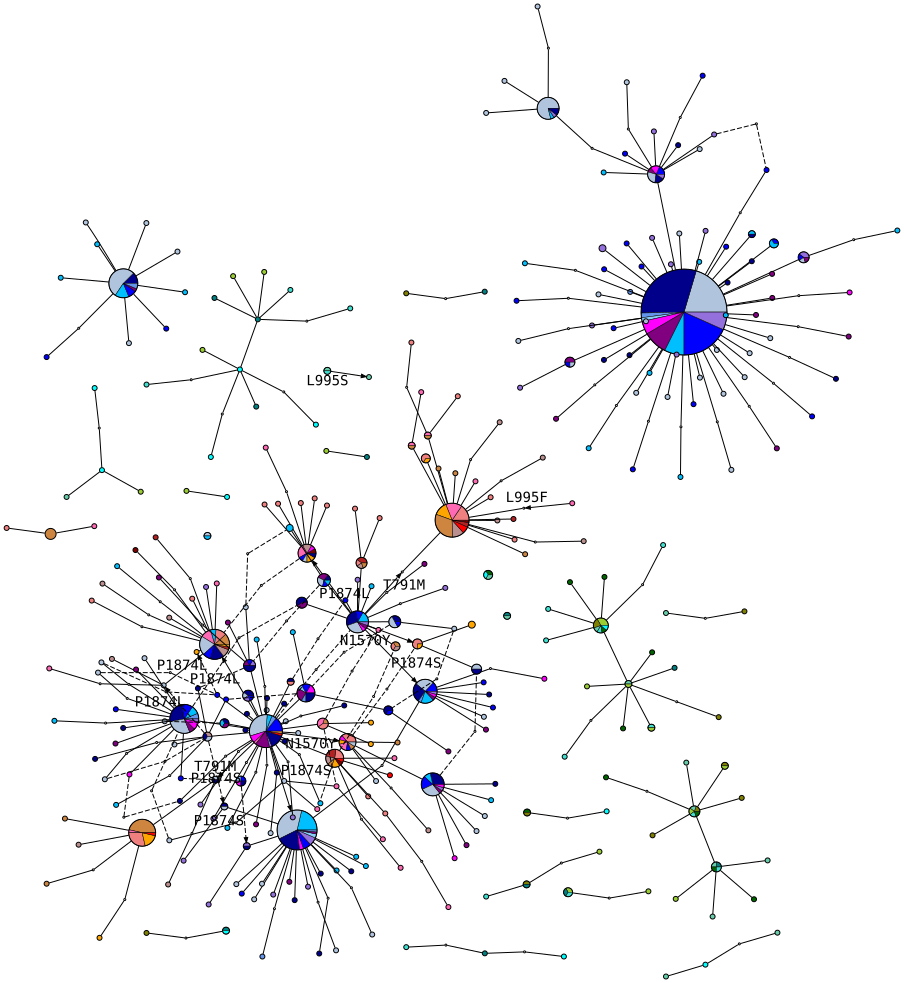

In [27]:
%%capture --no-stdout --no-display
# check network construction works - network all haplotypes
graph, _ = graph_haplotype_network(
    ht,
    network_method='msn',
    hap_colors=hap_colors,
    max_dist= 2,
    variant_labels=variant_labels,
    show_singletons=False)
graph

In [28]:
#sf = list(ag_dict.keys())
#ccmap = dict(zip(sf, sp_col))
#handles = [mpl.patches.Patch(color=v, label=ag_dict[k]) for k, v in ccmap.items()]
#fig.legend(title='Species', labels=leg_labels, handles=handles,bbox_to_anchor=(0.68, 0.9),frameon=False,
#          prop={'size':11, 'style': 'italic'}, title_fontproperties={'size':13, 'weight':'bold'}, alignment='left')

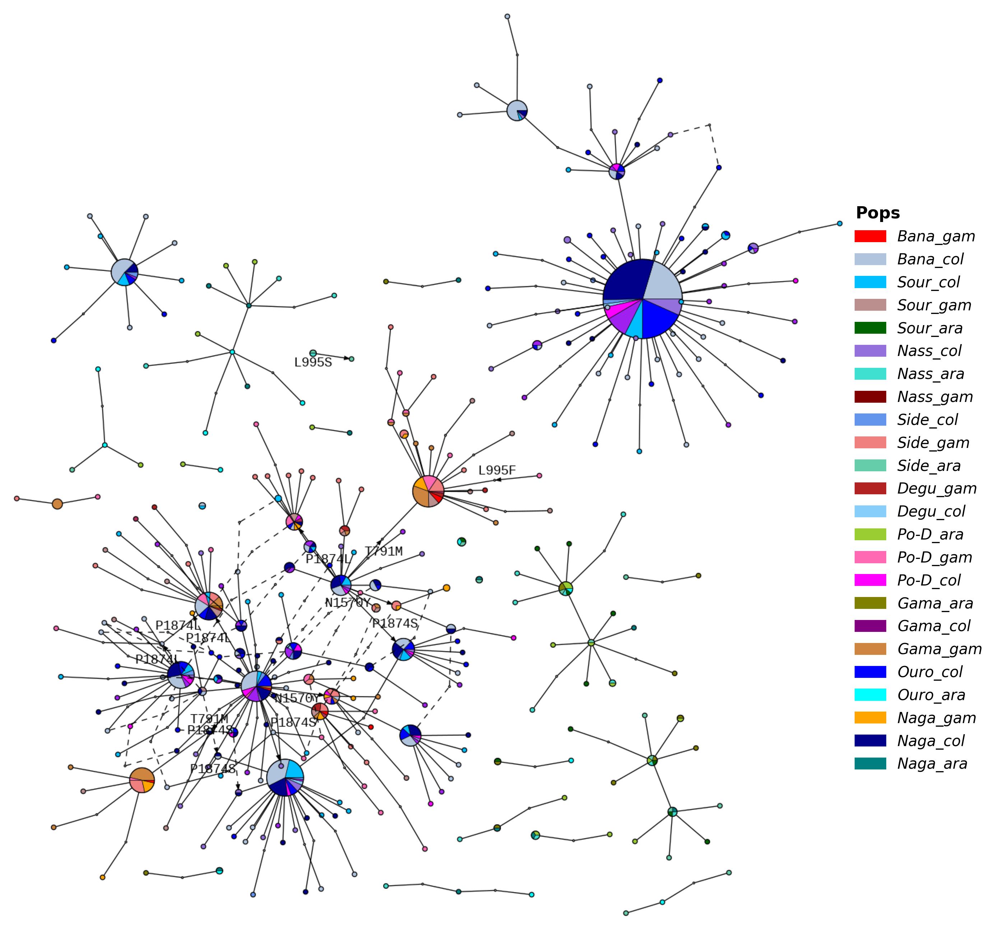

In [29]:
img_bytes = graph.pipe(format='png')
img = Image.open(BytesIO(img_bytes))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(10, 12), dpi=300)
ax.imshow(img)
sf = list(pop_colors.keys())
sp_col = [pop_colors[key] for key in sf]
ccmap = dict(zip(sf, sp_col))

handles = [mpl.patches.Patch(color=v, label=pop_colors[k]) for k, v in ccmap.items()]

ax.legend(title='Pops', labels=sf, handles=handles,
          bbox_to_anchor=(1.18, 0.8),frameon=False,#ncol=2,
          prop={'size':10, 'style': 'italic'},
          title_fontproperties={'size':11, 'weight':'bold'},
          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk_global1_all.png',dpi=300, bbox_inches='tight')

### by species

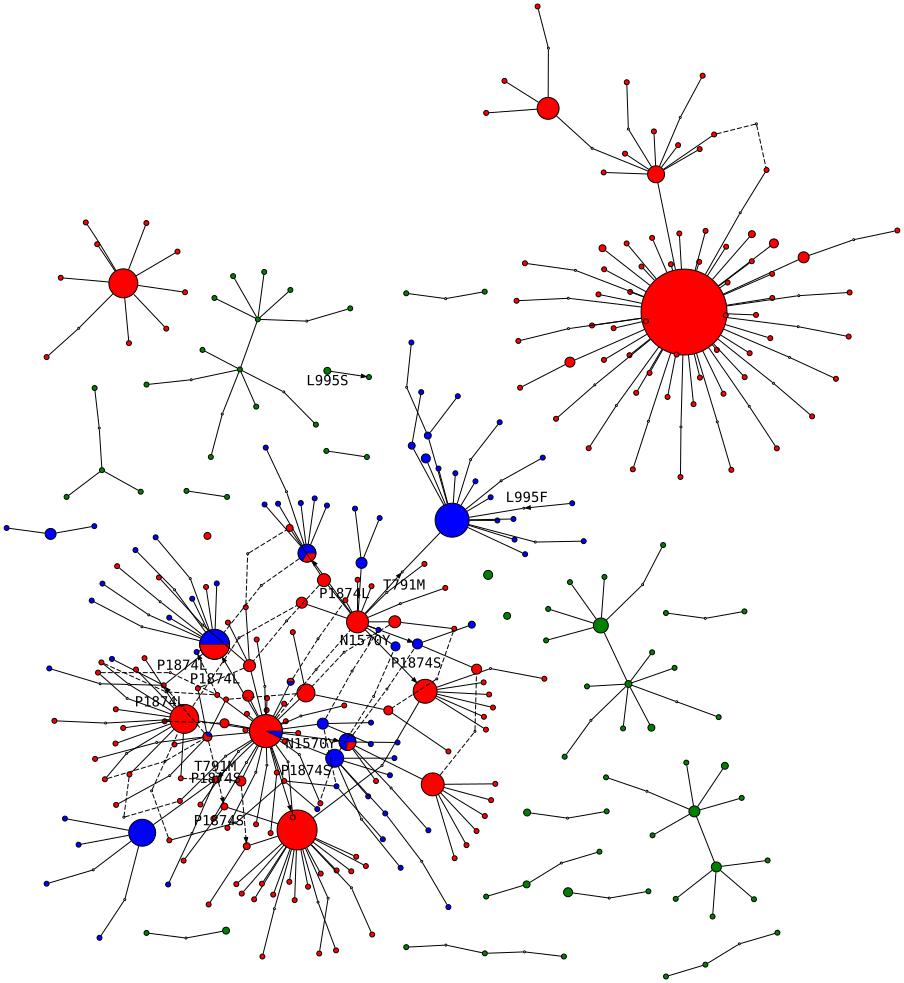

In [30]:
%%capture --no-stdout --no-display
# check network construction works - network all haplotypes
graph1, _ = graph_haplotype_network(
    ht,
    network_method='msn',
    hap_colors=hap_colors2,
    max_dist= 2,
    variant_labels=variant_labels,
    show_singletons=False)
graph1

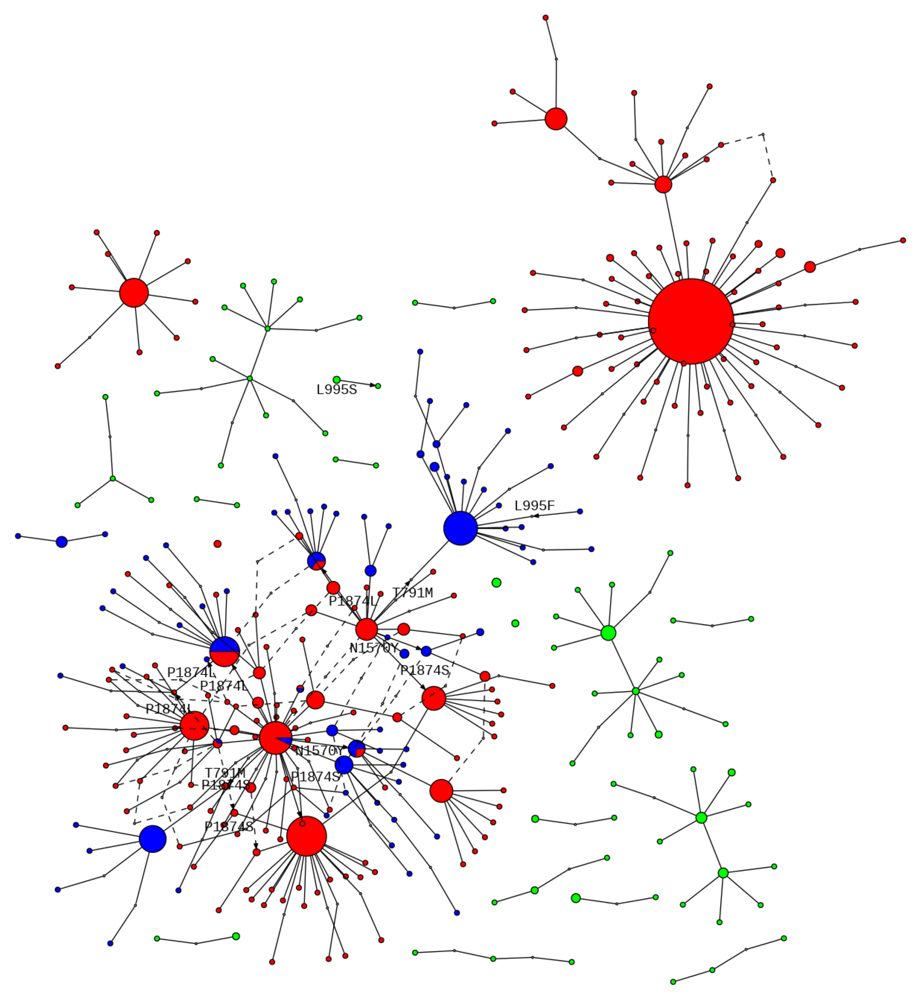

In [31]:
img_bytes = graph1.pipe(format='png')
img = Image.open(BytesIO(img_bytes))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(10, 12), dpi=300)
ax.imshow(img)
sf = list(pop_colors2.keys())
sp_col = [pop_colors2[key] for key in sf]
ccmap = dict(zip(sf, sp_col))

handles = [mpl.patches.Patch(color=v, label=pop_colors2[k]) for k, v in ccmap.items()]

#ax.legend(title='Pops', labels=sf, handles=handles,
#          bbox_to_anchor=(0.1, 1),frameon=False,#ncol=2,
#          prop={'size':10, 'style': 'italic'},
#          title_fontproperties={'size':11, 'weight':'bold'},
#          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk_global1_all_species_1.png',dpi=300, bbox_inches='tight')

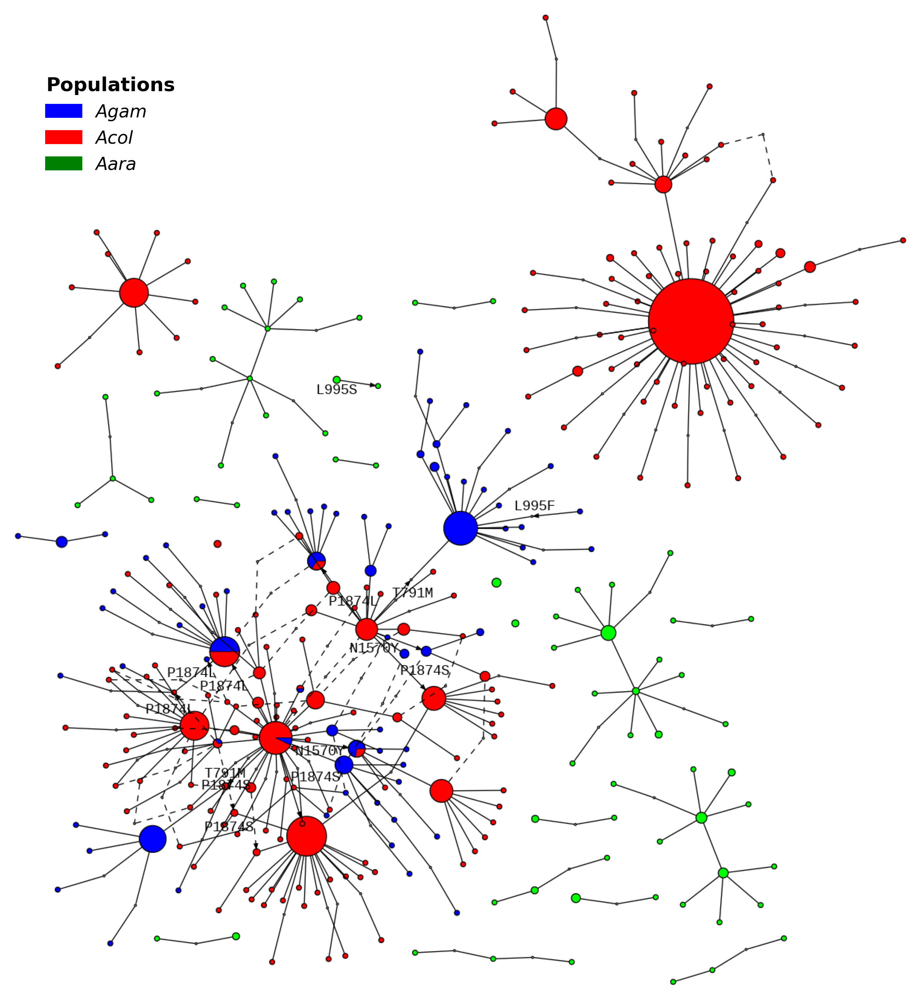

In [32]:
img_bytes = graph1.pipe(format='png')
img = Image.open(BytesIO(img_bytes))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(10, 12), dpi=300)
ax.imshow(img)
sf = list(pop_colors2.keys())
sp_col = [pop_colors2[key] for key in sf]
ccmap = dict(zip(sf, sp_col))

handles = [mpl.patches.Patch(color=v, label=pop_colors2[k]) for k, v in ccmap.items()]

ax.legend(title='Populations', labels=sf, handles=handles,
          bbox_to_anchor=(0.2, 0.95),frameon=False,#ncol=2,
          prop={'size':11, 'style': 'italic'},
          title_fontproperties={'size':12, 'weight':'bold'},
          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk_global1_all_species_12.png',dpi=300, bbox_inches='tight')

## by diplotypes

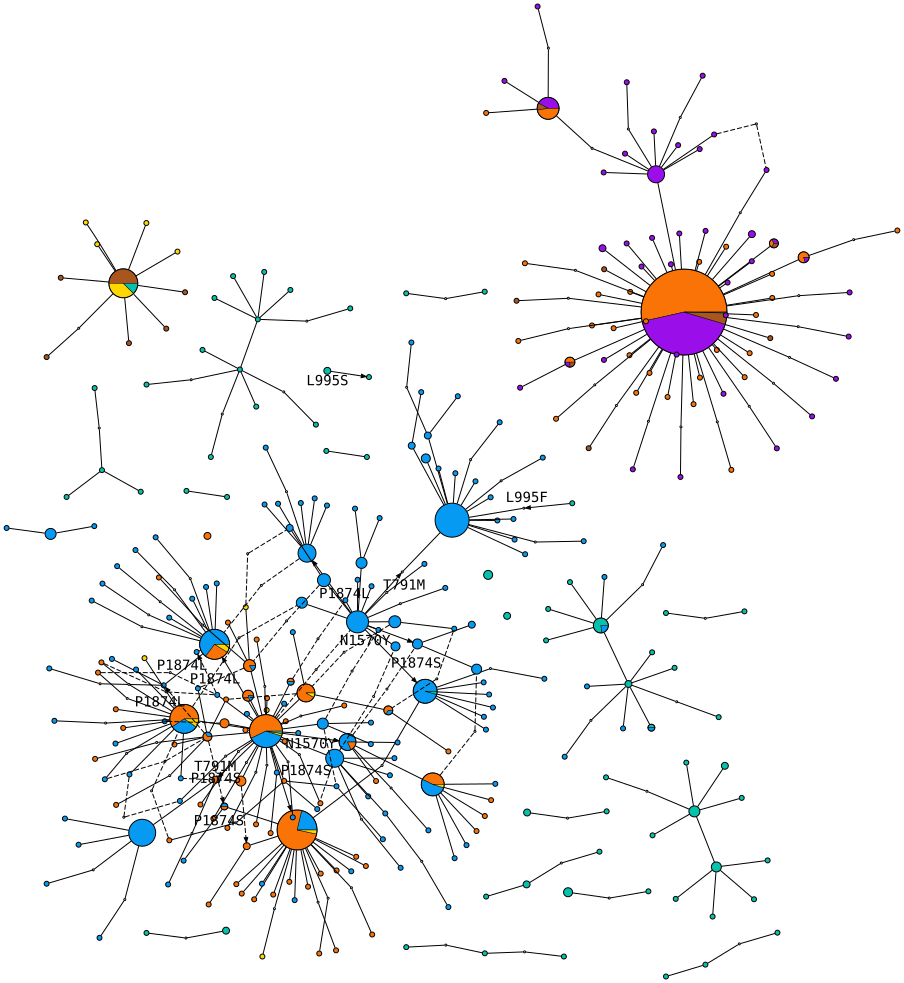

In [33]:
%%capture --no-stdout --no-display
# check network construction works - network all haplotypes
graph2, _ = graph_haplotype_network(
    ht,
    network_method='msn',
    hap_colors=diplo_colors,
    max_dist= 2,
    variant_labels=variant_labels,
    show_singletons=False)
graph2

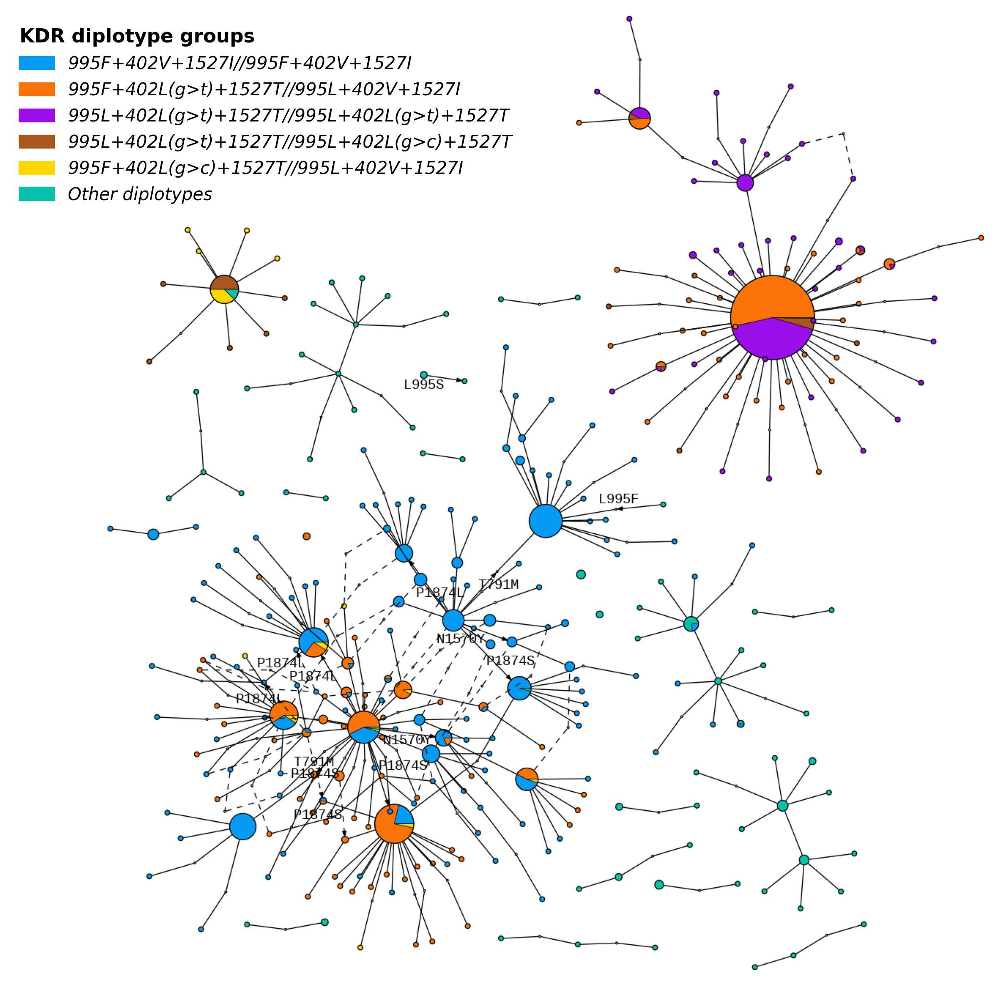

In [34]:
img_bytes = graph2.pipe(format='png')
img = Image.open(BytesIO(img_bytes))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(14, 10), dpi=300)
ax.imshow(img)
sf = list(colors_diplo.keys())
sp_col = [colors_diplo[key] for key in sf]
ccmap = dict(zip(sf, sp_col))

handles = [mpl.patches.Patch(color=v, label=colors_diplo[k]) for k, v in ccmap.items()]

ax.legend(title='KDR diplotype groups', labels=sf, handles=handles,
          bbox_to_anchor=(0.48, 1),frameon=False,#ncol=2,
          prop={'size':10, 'style': 'italic'},
          title_fontproperties={'size':11, 'weight':'bold'},
          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk_global1_all_diplo.png',dpi=300, bbox_inches='tight')

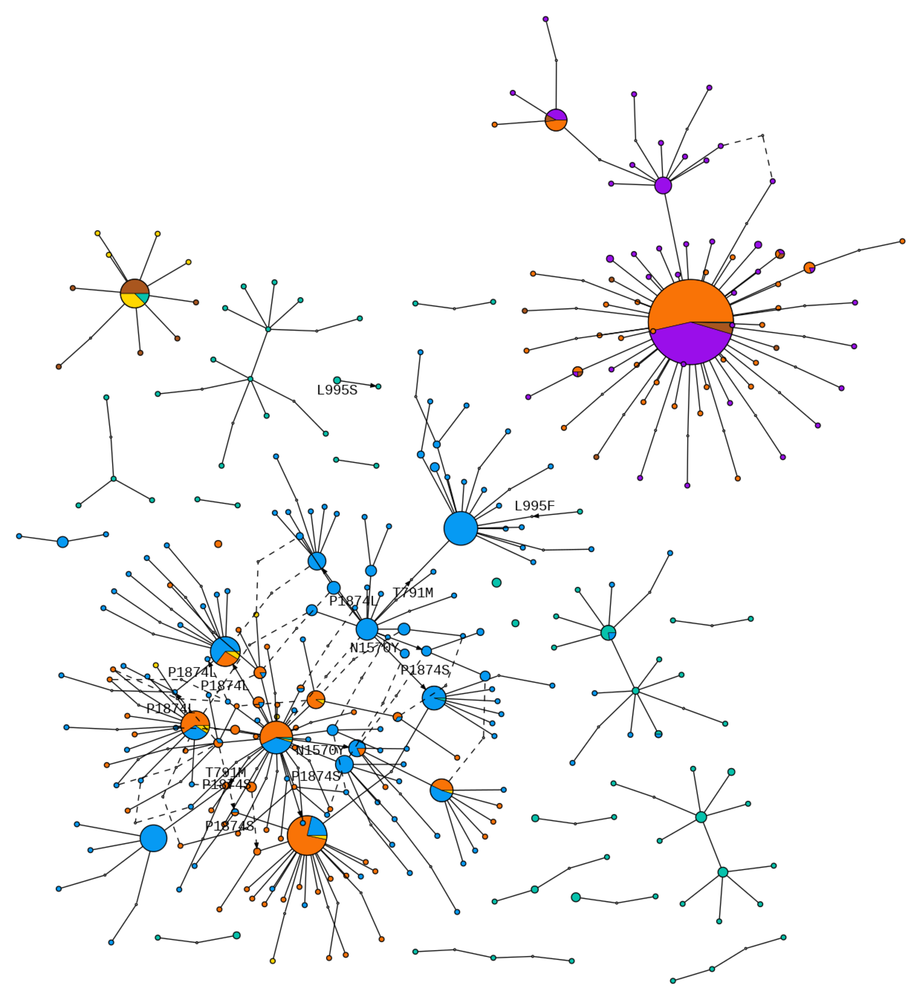

In [35]:
img_bytes = graph2.pipe(format='png')
img = Image.open(BytesIO(img_bytes))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(14, 10), dpi=300)
ax.imshow(img)
sf = list(colors_diplo.keys())
sp_col = [colors_diplo[key] for key in sf]
ccmap = dict(zip(sf, sp_col))

handles = [mpl.patches.Patch(color=v, label=colors_diplo[k]) for k, v in ccmap.items()]

#ax.legend(title='Pops', labels=sf, handles=handles,
#          bbox_to_anchor=(0.48, 1),frameon=False,#ncol=2,
#          prop={'size':10, 'style': 'italic'},
#          title_fontproperties={'size':11, 'weight':'bold'},
#          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk_global1_all_diplo1.png',dpi=300, bbox_inches='tight')

## Haplotype networks - global

In [36]:
graph, h_distinct_sets, components = graph_haplotype_network(
    ht,
    network_method='mjn',
    max_dist=2,
    hap_colors=hap_colors,
    variant_labels=variant_labels,
    return_components=True,  # new option, N.B., changes return values
    show_singletons=False,  # new option, don't show unconnected singleton nodes, makes graph less noisy
)
graph.format = 'png'
graph.attr(dpi='300')
fn = 'fig_networks/hap_netwk_global'
graph.render(fn)

'fig_networks/hap_netwk_global.png'

In [ ]:
#components

### Network around each variants

In [37]:
# locate haplotypes with resistance alleles
pos_995S = 2422651
pos_995F = 2422652
pos_1527T = 2429617
pos_1570Y = 2429745
pos_1874S = 2430880
pos_1874L = 2430881
loc_995S = ht[ds_pos.locate_key(pos_995S)] == 1
loc_995F = ht[ds_pos.locate_key(pos_995F)] == 1
loc_1527T = ht[ds_pos.locate_key(pos_1527T)] == 1
loc_1570Y = ht[ds_pos.locate_key(pos_1570Y)] == 1
loc_1874S = ht[ds_pos.locate_key(pos_1874S)] == 1
loc_1874L = ht[ds_pos.locate_key(pos_1874L)] == 1

In [ ]:
#df_vgsc

In [38]:
pop_995F = dfs_haps.pops.iloc[loc_995F]
pop_995S = dfs_haps.pops.iloc[loc_995S]
pop_1527T = dfs_haps.pops.iloc[loc_1527T]
pop_1570Y = dfs_haps.pops.iloc[loc_1570Y]
pop_1874S = dfs_haps.pops.iloc[loc_1874S]
pop_1874L = dfs_haps.pops.iloc[loc_1874L]

In [39]:
np.count_nonzero(loc_995F), np.count_nonzero(loc_995S), np.count_nonzero(loc_1527T), np.count_nonzero(loc_1570Y),np.count_nonzero(loc_1874S),np.count_nonzero(loc_1874L),

(672, 29, 470, 60, 134, 74)

In [40]:
# resistance haps
h_vgsc_995F = ht.compress(loc_995F, axis=1)
h_vgsc_995S = ht.compress(loc_995S, axis=1)
h_vgsc_1527T = ht.compress(loc_1527T, axis=1)
h_vgsc_1570Y = ht.compress(loc_1570Y, axis=1)
h_vgsc_1570Y = ht.compress(loc_1570Y, axis=1)
h_vgsc_1874S = ht.compress(loc_1874S, axis=1)
h_vgsc_1874L = ht.compress(loc_1874L, axis=1)

In [41]:
# colours
hap_colors_995F = hap_colors.compress(loc_995F)
hap_colors_995S = hap_colors.compress(loc_995S)
hap_colors_1527T = hap_colors.compress(loc_1527T)
hap_colors_1570Y = hap_colors.compress(loc_1570Y)
hap_colors_1874S = hap_colors.compress(loc_1874S)
hap_colors_1874L = hap_colors.compress(loc_1874L)

In [42]:
# original haplotype indices - will need these for cluster correspondence
hap_ixs_995F = hap_ixs.compress(loc_995F)
hap_ixs_995S = hap_ixs.compress(loc_995S)
hap_ixs_1527T = hap_ixs.compress(loc_1527T)
hap_ixs_1570Y = hap_ixs.compress(loc_1570Y)
hap_ixs_1874S = hap_ixs.compress(loc_1874S)
hap_ixs_1874L = hap_ixs.compress(loc_1874L)

## L995F networks

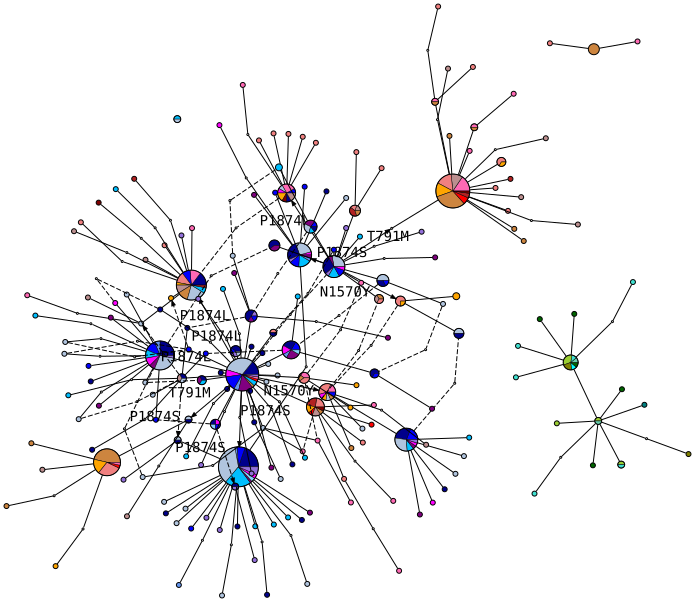

In [43]:
%%capture --no-stdout --no-display
# check network construction works - network all haplotypes
graph_995F, _ = graph_haplotype_network(
    h_vgsc_995F,
    network_method='msn',
    hap_colors=hap_colors_995F,
    max_dist= 2,
    variant_labels=variant_labels,
    show_singletons=False)
graph_995F

In [44]:
graph_995F, h_distinct_sets_995F, components_995F = graph_haplotype_network(
    h_vgsc_995F,
    network_method='mjn',
    max_dist=2,
    hap_colors=hap_colors_995F,
    variant_labels=variant_labels,
    return_components=True,  # new option, N.B., changes return values
    show_singletons=False,  # new option, don't show unconnected singleton nodes, makes graph less noisy
)
graph_995F#.format = 'png'
graph_995F.attr(dpi='300')
fn = 'fig_networks/hap_netwk_995F'
graph_995F.render(fn)

'fig_networks/hap_netwk_995F.png'

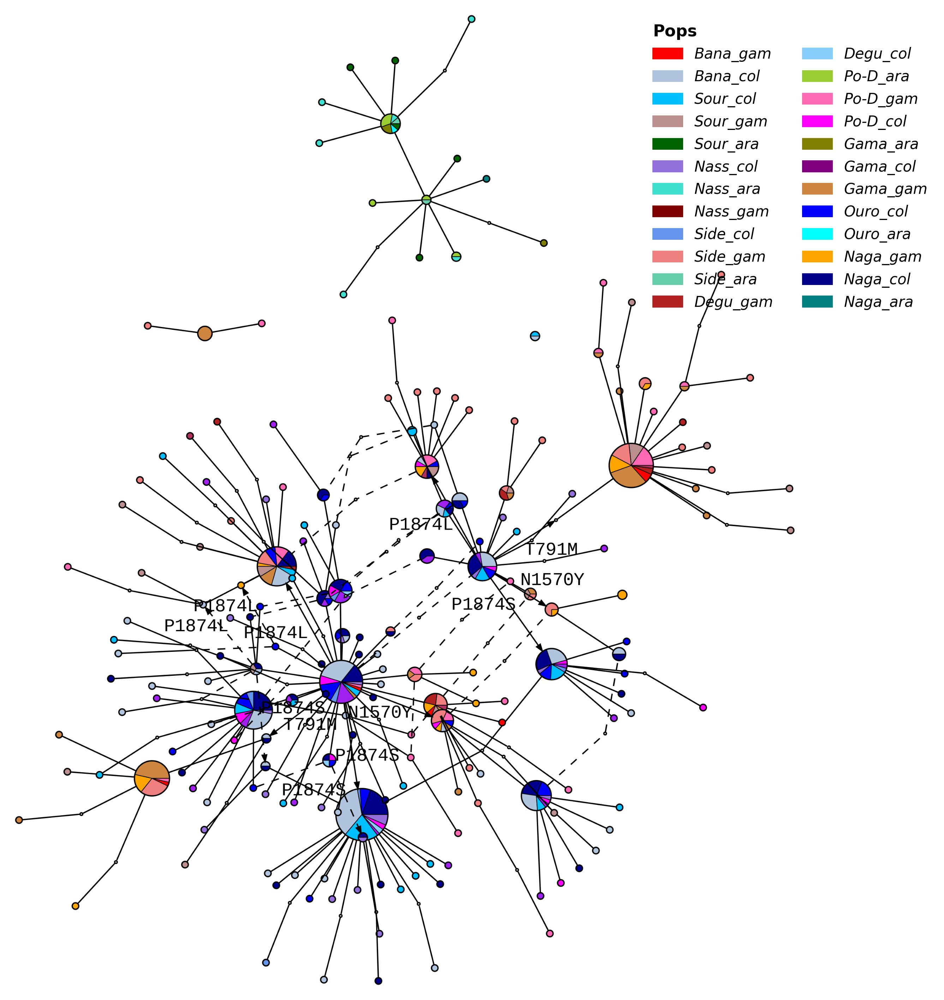

In [45]:
img_bytes_995F = graph_995F.pipe(format='png')
img_995F = Image.open(BytesIO(img_bytes_995F))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(12, 12), dpi=300)
ax.imshow(img_995F)
L995F_hap_col = {}
for key in pop_colors.keys():
    if pop_colors[key] in np.unique(hap_colors_995F):
        L995F_hap_col[key]= pop_colors[key]
sf_995F = list(L995F_hap_col.keys())
sp_col_995F = [L995F_hap_col[key] for key in sf_995F]
ccmap_995F = dict(zip(sf_995F, sp_col_995F))

handles_995F = [mpl.patches.Patch(color=v, label=L995F_hap_col[k]) for k, v in ccmap_995F.items()]

ax.legend(title='Pops', labels=sf_995F, handles=handles_995F,
          bbox_to_anchor=(1.18, 1),frameon=False,ncol=2,
          prop={'size':10, 'style': 'italic'},
          title_fontproperties={'size':11, 'weight':'bold'},
          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk__995F.png',dpi=300, bbox_inches='tight')

### 1527T networks

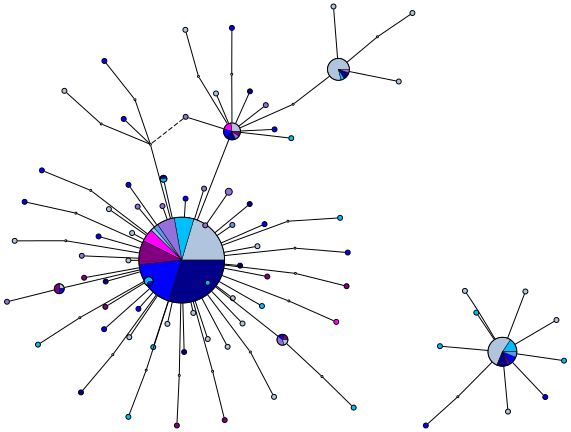

In [46]:
%%capture --no-stdout --no-display
# check network construction works - network all haplotypes
graph_1527T, _ = graph_haplotype_network(
    h_vgsc_1527T,
    network_method='mjn',
    hap_colors=hap_colors_1527T,
    max_dist= 2,
    variant_labels=variant_labels,
    show_singletons=False)
graph_1527T

In [47]:
graph_1527T, h_distinct_sets_1527T, components_1527T = graph_haplotype_network(
    h_vgsc_1527T,
    network_method='mjn',
    max_dist=2,
    hap_colors=hap_colors_1527T,
    variant_labels=variant_labels,
    return_components=True,  # new option, N.B., changes return values
    show_singletons=False,  # new option, don't show unconnected singleton nodes, makes graph less noisy
)
graph_1527T.format = 'png'
graph_1527T.attr(dpi='300')
fn = 'fig_networks/hap_netwk_1527T'
graph_1527T.render(fn)

'fig_networks/hap_netwk_1527T.png'

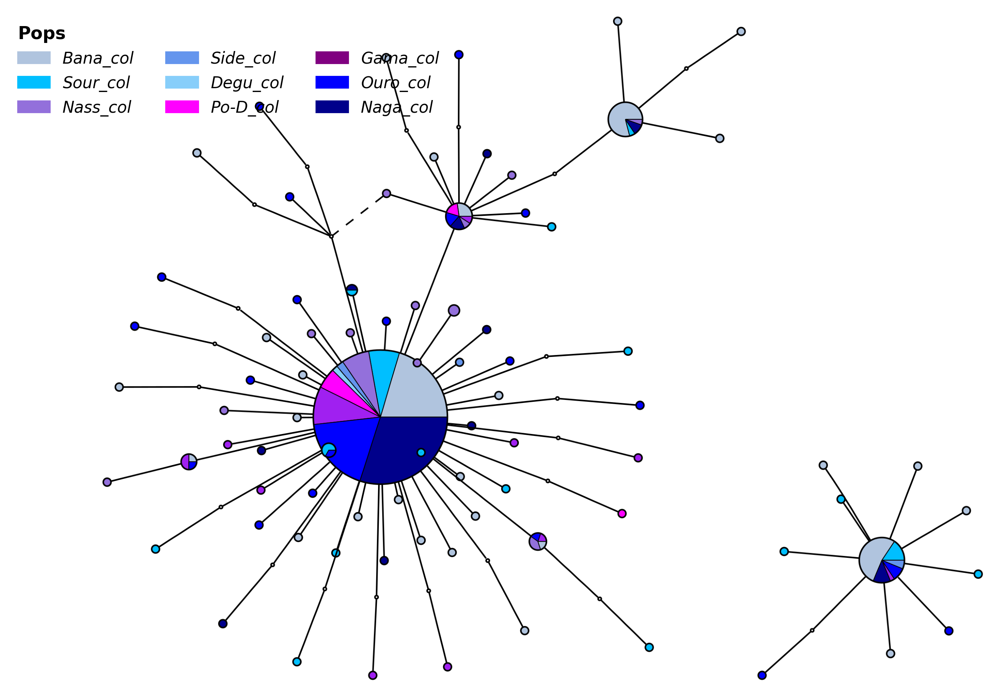

In [48]:
img_bytes_1527T = graph_1527T.pipe(format='png')
img_1527T = Image.open(BytesIO(img_bytes_1527T))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
ax.imshow(img_1527T)
I1527T_hap_col = {}
for key in pop_colors.keys():
    if pop_colors[key] in np.unique(hap_colors_1527T):
        I1527T_hap_col[key]= pop_colors[key]
sf_1527T = list(I1527T_hap_col.keys())
sp_col_1527T = [I1527T_hap_col[key] for key in sf_1527T]
ccmap_1527T = dict(zip(sf_1527T, sp_col_1527T))

handles_1527T = [mpl.patches.Patch(color=v, label=I1527T_hap_col[k]) for k, v in ccmap_1527T.items()]

ax.legend(title='Pops', labels=sf_1527T, handles=handles_1527T,
          bbox_to_anchor=(0.4, 1),frameon=False,ncol=3,
          prop={'size':10, 'style': 'italic'},
          title_fontproperties={'size':11, 'weight':'bold'},
          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk__1527T.png',dpi=300, bbox_inches='tight')

### N1570Y networks

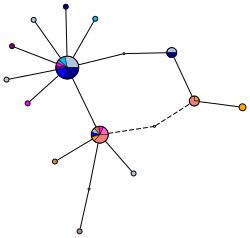

In [49]:
%%capture --no-stdout --no-display
# check network construction works - network all haplotypes
graph_1570Y, _ = graph_haplotype_network(
    h_vgsc_1570Y,
    network_method='msn',
    hap_colors=hap_colors_1570Y,
    max_dist= 2,
    variant_labels=variant_labels,
    show_singletons=False)
graph_1570Y

In [50]:
graph_1570Y, h_distinct_sets_1570Y, components_1570Y = graph_haplotype_network(
    h_vgsc_1570Y,
    network_method='mjn',
    max_dist=2,
    hap_colors=hap_colors_1570Y,
    variant_labels=variant_labels,
    return_components=True,  # new option, N.B., changes return values
    show_singletons=False,  # new option, don't show unconnected singleton nodes, makes graph less noisy
)
graph_1570Y.format = 'png'
graph_1570Y.attr(dpi='300')
fn = 'fig_networks/hap_netwk_1570Y'
graph_1570Y.render(fn)

'fig_networks/hap_netwk_1570Y.png'

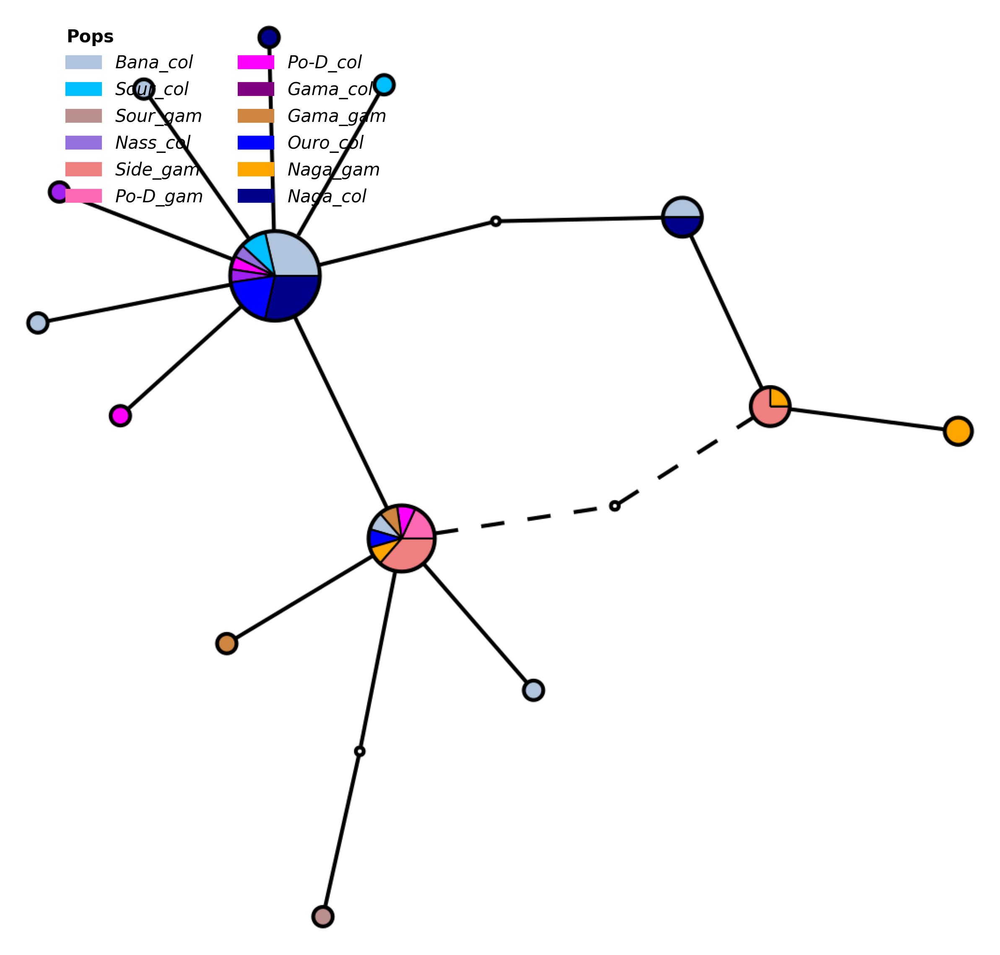

In [51]:
img_bytes_1570Y = graph_1570Y.pipe(format='png')
img_1570Y = Image.open(BytesIO(img_bytes_1570Y))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
ax.imshow(img_1570Y)
N1570Y_hap_col = {}
for key in pop_colors.keys():
    if pop_colors[key] in np.unique(hap_colors_1570Y):
        N1570Y_hap_col[key]= pop_colors[key]
sf_1570Y = list(N1570Y_hap_col.keys())
sp_col_1570Y = [N1570Y_hap_col[key] for key in sf_1570Y]
ccmap_1570Y = dict(zip(sf_1570Y, sp_col_1570Y))

handles_1570Y = [mpl.patches.Patch(color=v, label=N1570Y_hap_col[k]) for k, v in ccmap_1570Y.items()]

ax.legend(title='Pops', labels=sf_1570Y, handles=handles_1570Y,
          bbox_to_anchor=(0.4, 1),frameon=False,ncol=2,
          prop={'size':10, 'style': 'italic'},
          title_fontproperties={'size':10, 'weight':'bold'},
          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk_1570Y.png',dpi=300, bbox_inches='tight')

### L995S networks

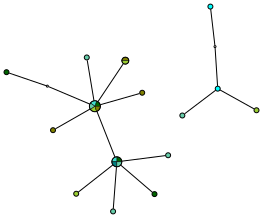

In [52]:
%%capture --no-stdout --no-display
# check network construction works - network all haplotypes
graph_995S, _ = graph_haplotype_network(
    h_vgsc_995S,
    network_method='msn',
    hap_colors=hap_colors_995S,
    max_dist= 2,
    variant_labels=variant_labels,
    show_singletons=False)
graph_995S

In [53]:
graph_995S, h_distinct_sets_995S, components_995S = graph_haplotype_network(
    h_vgsc_995S,
    network_method='mjn',
    max_dist=2,
    hap_colors=hap_colors_995S,
    variant_labels=variant_labels,
    return_components=True,  # new option, N.B., changes return values
    show_singletons=False,  # new option, don't show unconnected singleton nodes, makes graph less noisy
)
graph_995S.format = 'png'
graph_995S.attr(dpi='300')
fn = 'fig_networks/hap_netwk__995S'
graph_995S.render(fn)

'fig_networks/hap_netwk__995S.png'

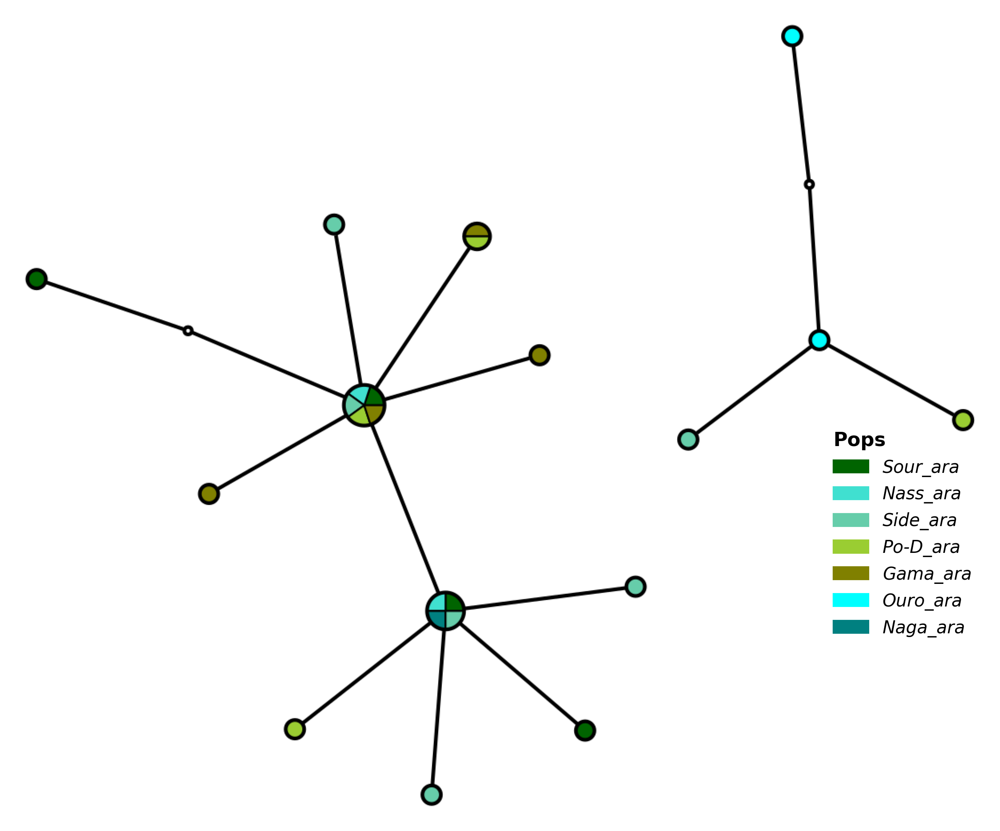

In [54]:
img_bytes_995S = graph_995S.pipe(format='png')
img_995S = Image.open(BytesIO(img_bytes_995S))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
ax.imshow(img_995S)
L995S_hap_col = {}
for key in pop_colors.keys():
    if pop_colors[key] in np.unique(hap_colors_995S):
        L995S_hap_col[key]= pop_colors[key]
sf_995S = list(L995S_hap_col.keys())
sp_col_995S = [L995S_hap_col[key] for key in sf_995S]
ccmap_995S = dict(zip(sf_995S, sp_col_995S))

handles_995S = [mpl.patches.Patch(color=v, label=L995S_hap_col[k]) for k, v in ccmap_995S.items()]

ax.legend(title='Pops', labels=sf_995S, handles=handles_995S,
          bbox_to_anchor=(1, 0.5),frameon=False,ncol=1,
          prop={'size':10, 'style': 'italic'},
          title_fontproperties={'size':11, 'weight':'bold'},
          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk_995S.png',dpi=300, bbox_inches='tight')

### 1874S networks

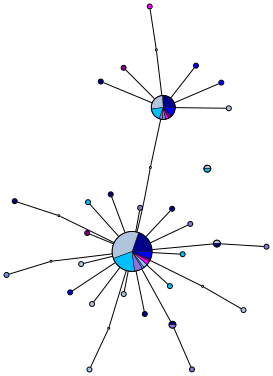

In [55]:
%%capture --no-stdout --no-display
# check network construction works - network all haplotypes
graph_1874S, _ = graph_haplotype_network(
    h_vgsc_1874S,
    network_method='msn',
    hap_colors=hap_colors_1874S,
    max_dist= 2,
    variant_labels=variant_labels,
    show_singletons=False)
graph_1874S

In [56]:
graph_1874S, h_distinct_sets_1874S, components_1874S = graph_haplotype_network(
    h_vgsc_1874S,
    network_method='mjn',
    max_dist=2,
    hap_colors=hap_colors_1874S,
    variant_labels=variant_labels,
    return_components=True,  # new option, N.B., changes return values
    show_singletons=False,  # new option, don't show unconnected singleton nodes, makes graph less noisy
)
graph_1874S.format = 'png'
graph_1874S.attr(dpi='300')
fn = 'fig_networks/hap_netwk_1874S.png'
graph_1874S.render(fn)

'fig_networks/hap_netwk_1874S.png.png'

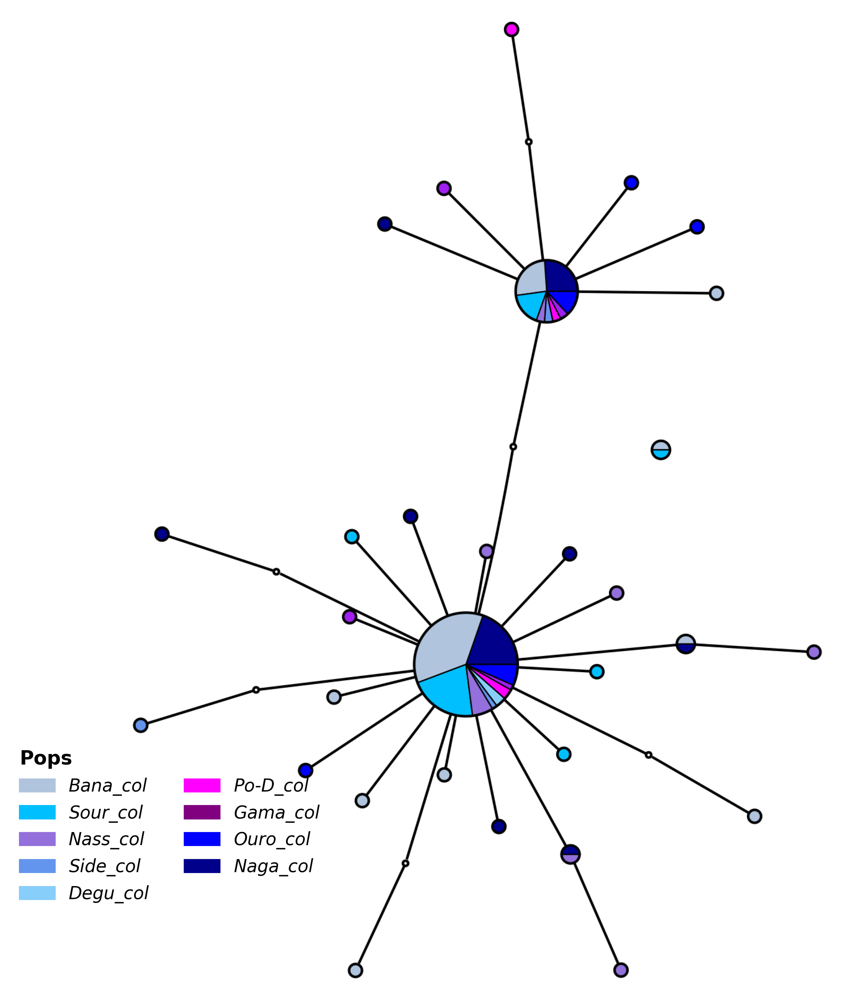

In [57]:
img_bytes_1874S = graph_1874S.pipe(format='png')
img_1874S = Image.open(BytesIO(img_bytes_1874S))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
ax.imshow(img_1874S)
P1874S_hap_col = {}
for key in pop_colors.keys():
    if pop_colors[key] in np.unique(hap_colors_1874S):
        P1874S_hap_col[key]= pop_colors[key]
sf_1874S = list(P1874S_hap_col.keys())
sp_col_1874S = [P1874S_hap_col[key] for key in sf_1874S]
ccmap_1874S = dict(zip(sf_1874S, sp_col_1874S))

handles_1874S = [mpl.patches.Patch(color=v, label=P1874S_hap_col[k]) for k, v in ccmap_1874S.items()]

ax.legend(title='Pops', labels=sf_1874S, handles=handles_1874S,
          bbox_to_anchor=(0.3, 0.26),frameon=False,ncol=2,
          prop={'size':10, 'style': 'italic'},
          title_fontproperties={'size':11, 'weight':'bold'},
          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk_1874S.png',dpi=300, bbox_inches='tight')

### 1874L networks

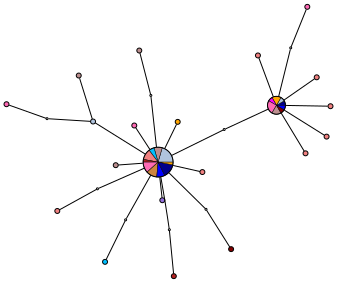

In [58]:
%%capture --no-stdout --no-display
# check network construction works - network all haplotypes
graph_1874L, _ = graph_haplotype_network(
    h_vgsc_1874L,
    network_method='msn',
    hap_colors=hap_colors_1874L,
    max_dist= 2,
    variant_labels=variant_labels,
    show_singletons=False)
graph_1874L

In [59]:
graph_1874L, h_distinct_sets_1874L, components_1874L = graph_haplotype_network(
    h_vgsc_1874L,
    network_method='mjn',
    max_dist=2,
    hap_colors=hap_colors_1874L,
    variant_labels=variant_labels,
    return_components=True,  # new option, N.B., changes return values
    show_singletons=False,  # new option, don't show unconnected singleton nodes, makes graph less noisy
)
graph_1874L.format = 'png'
graph_1874L.attr(dpi='300')
fn = 'fig_networks/hap_netwk_1874L.png'
graph_1874L.render(fn)

'fig_networks/hap_netwk_1874L.png.png'

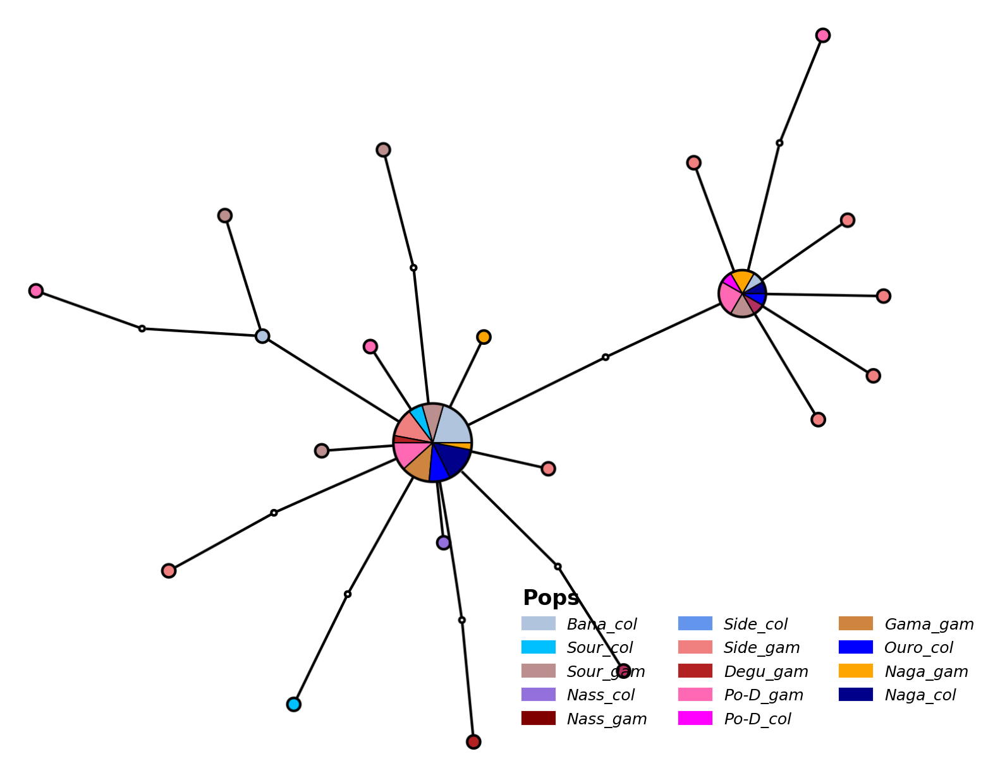

In [60]:
img_bytes_1874L = graph_1874L.pipe(format='png')
img_1874L = Image.open(BytesIO(img_bytes_1874L))

# Display the image in Matplotlib
fig, ax = plt.subplots(figsize=(6, 6), dpi=300)
ax.imshow(img_1874L)
P1874L_hap_col = {}
for key in pop_colors.keys():
    if pop_colors[key] in np.unique(hap_colors_1874L):
        P1874L_hap_col[key]= pop_colors[key]
sf_1874L = list(P1874L_hap_col.keys())
sp_col_1874L = [P1874L_hap_col[key] for key in sf_1874L]
ccmap_1874L = dict(zip(sf_1874L, sp_col_1874L))

handles_1874L = [mpl.patches.Patch(color=v, label=P1874L_hap_col[k]) for k, v in ccmap_1874L.items()]

ax.legend(title='Pops', labels=sf_1874L, handles=handles_1874L,
          bbox_to_anchor=(1.1, 0.25),frameon=False,ncol=3,
          prop={'size':6, 'style': 'italic'},
          title_fontproperties={'size':8, 'weight':'bold'},
          alignment='left')
ax.axis('off')  # Hide axes
plt.show()

fig.savefig('VGSC/fig_networks/hap_netwk_1874L.png',dpi=300, bbox_inches='tight')

In [61]:
#import matplotlib.colors as mcolors
#named_colors = list(mcolors.CSS4_COLORS.keys())
#print(named_colors)

In [62]:
#import matplotlib.colors as mcolors
#xkcd_colors = list(mcolors.XKCD_COLORS.keys())
#print(xkcd_colors)